# **Import liabraries**

In [9]:
%pip install imbalanced-learn

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.0 -> 25.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [1]:
import pandas as pd
import numpy as np
import re
from datetime import datetime

# Visualzation
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly.subplots import make_subplots


# Encoding
from sklearn.preprocessing import OrdinalEncoder, LabelEncoder

# PreProcessing
from sklearn.preprocessing import StandardScaler


# Modeling
from sklearn.model_selection import train_test_split ,GridSearchCV
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier , VotingClassifier , GradientBoostingClassifier
from imblearn.over_sampling import SMOTE

# Eval
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_auc_score, roc_curve, auc

# Saving model
import pickle

# warning
import warnings
warnings.filterwarnings('ignore')

In [4]:
# import data
df = pd.read_csv('../Road-Accidents-Prediction-System/Dataset/RTA Dataset.csv')
df.head(10)

,Time,Day_of_week,Age_band_of_driver,Sex_of_driver,Educational_level,Vehicle_driver_relation,Driving_experience,Type_of_vehicle,Owner_of_vehicle,Service_year_of_vehicle,...,Vehicle_movement,Casualty_class,Sex_of_casualty,Age_band_of_casualty,Casualty_severity,Work_of_casuality,Fitness_of_casuality,Pedestrian_movement,Cause_of_accident,Accident_severity
0,17:02:00,Monday,18-30,Male,Above high school,Employee,1-2yr,Automobile,Owner,Above 10yr,...,Going straight,na,na,na,na,NaN,NaN,Not a Pedestrian,Moving Backward,Slight Injury
1,17:02:00,Monday,31-50,Male,Junior high school,Employee,Above 10yr,Public (> 45 seats),Owner,5-10yrs,...,Going straight,na,na,na,na,NaN,NaN,Not a Pedestrian,Overtaking,Slight Injury
2,17:02:00,Monday,18-30,Male,Junior high school,Employee,1-2yr,Lorry (41?100Q),Owner,NaN,...,Going straight,Driver or rider,Male,31-50,3,Driver,NaN,Not a Pedestrian,Changing lane to the left,Serious Injury
3,1:06:00,Sunday,18-30,Male,Junior high school,Employee,5-10yr,Public (> 45 seats),Governmental,NaN,...,Going straight,Pedestrian,Female,18-30,3,Driver,Normal,Not a Pedestrian,Changing lane to the right,Slight Injury
4,1:06:00,Sunday,18-30,Male,Junior high school,Employee,2-5yr,NaN,Owner,5-10yrs,...,Going straight,na,na,na,na,NaN,NaN,Not a Pedestrian,Overtaking,Slight Injury
5,14:15:00,Friday,31-50,Male,NaN,Unknown,NaN,NaN,NaN,NaN,...,U-Turn,Driver or rider,Male,31-50,3,Driver,Normal,Not a Pedestrian,Overloading,Slight Injury
6,17:30:00,Wednesday,18-30,Male,Junior high school,Employee,2-5yr,Automobile,Owner,NaN,...,Moving Backward,Driver or rider,Female,18-30,3,Driver,Normal,Not a Pedestrian,Other,Slight Injury
7,17:20:00,Friday,18-30,Male,Junior high school,Employee,2-5yr,Automobile,Governmental,Above 10yr,...,U-Turn,na,na,na,na,NaN,Normal,Not a Pedestrian,No priority to vehicle,Slight Injury
8,17:20:00,Friday,18-30,Male,Junior high school,Employee,Above 10yr,Lorry (41?100Q),Owner,1-2yr,...,Going straight,Pedestrian,Male,Under 18,3,Driver,Normal,Crossing from driver's nearside,Changing lane to the right,Slight Injury
9,17:20:00,Friday,18-30,Male,Junior high school,Employee,1-2yr,Automobile,Owner,2-5yrs,...,U-Turn,Passenger,Male,18-30,3,Driver,Normal,Not a Pedestrian,Moving Backward,Serious Injury


# **Data Exploration**

*Data Structure:*

	•	Dataset Name: Road Traffic Accident (RTA) Dataset
	•	Rows: ~12k records
	•	Columns: 30 features
	•	Target column: Accident_severity → 3 classes:
		- Fatal injury, Serious injury, Slight injury

In [334]:
print("Shape:", df.shape)
print("\nDuplicates:", df.duplicated().sum())

Shape: (12316, 32)

Duplicates: 0


In [335]:
print("Missing values:\n", df.isnull().sum())

Missing values:
 Time                              0
Day_of_week                       0
Age_band_of_driver                0
Sex_of_driver                     0
Educational_level               741
Vehicle_driver_relation         579
Driving_experience              829
Type_of_vehicle                 950
Owner_of_vehicle                482
Service_year_of_vehicle        3928
Defect_of_vehicle              4427
Area_accident_occured           239
Lanes_or_Medians                385
Road_allignment                 142
Types_of_Junction               887
Road_surface_type               172
Road_surface_conditions           0
Light_conditions                  0
Weather_conditions                0
Type_of_collision               155
Number_of_vehicles_involved       0
Number_of_casualties              0
Vehicle_movement                308
Casualty_class                    0
Sex_of_casualty                   0
Age_band_of_casualty              0
Casualty_severity                 0
Work_of_cas

In [336]:
print("Unique values:\n", df.nunique())

Unique values:
 Time                           1074
Day_of_week                       7
Age_band_of_driver                5
Sex_of_driver                     3
Educational_level                 7
Vehicle_driver_relation           4
Driving_experience                7
Type_of_vehicle                  17
Owner_of_vehicle                  4
Service_year_of_vehicle           6
Defect_of_vehicle                 3
Area_accident_occured            14
Lanes_or_Medians                  7
Road_allignment                   9
Types_of_Junction                 8
Road_surface_type                 5
Road_surface_conditions           4
Light_conditions                  4
Weather_conditions                9
Type_of_collision                10
Number_of_vehicles_involved       6
Number_of_casualties              8
Vehicle_movement                 13
Casualty_class                    4
Sex_of_casualty                   3
Age_band_of_casualty              6
Casualty_severity                 4
Work_of_casu

In [337]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12316 entries, 0 to 12315
Data columns (total 32 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   Time                         12316 non-null  object
 1   Day_of_week                  12316 non-null  object
 2   Age_band_of_driver           12316 non-null  object
 3   Sex_of_driver                12316 non-null  object
 4   Educational_level            11575 non-null  object
 5   Vehicle_driver_relation      11737 non-null  object
 6   Driving_experience           11487 non-null  object
 7   Type_of_vehicle              11366 non-null  object
 8   Owner_of_vehicle             11834 non-null  object
 9   Service_year_of_vehicle      8388 non-null   object
 10  Defect_of_vehicle            7889 non-null   object
 11  Area_accident_occured        12077 non-null  object
 12  Lanes_or_Medians             11931 non-null  object
 13  Road_allignment              12

In [338]:
df.head()

,Time,Day_of_week,Age_band_of_driver,Sex_of_driver,Educational_level,Vehicle_driver_relation,Driving_experience,Type_of_vehicle,Owner_of_vehicle,Service_year_of_vehicle,...,Vehicle_movement,Casualty_class,Sex_of_casualty,Age_band_of_casualty,Casualty_severity,Work_of_casuality,Fitness_of_casuality,Pedestrian_movement,Cause_of_accident,Accident_severity
0,17:02:00,Monday,18-30,Male,Above high school,Employee,1-2yr,Automobile,Owner,Above 10yr,...,Going straight,na,na,na,na,NaN,NaN,Not a Pedestrian,Moving Backward,Slight Injury
1,17:02:00,Monday,31-50,Male,Junior high school,Employee,Above 10yr,Public (> 45 seats),Owner,5-10yrs,...,Going straight,na,na,na,na,NaN,NaN,Not a Pedestrian,Overtaking,Slight Injury
2,17:02:00,Monday,18-30,Male,Junior high school,Employee,1-2yr,Lorry (41?100Q),Owner,NaN,...,Going straight,Driver or rider,Male,31-50,3,Driver,NaN,Not a Pedestrian,Changing lane to the left,Serious Injury
3,1:06:00,Sunday,18-30,Male,Junior high school,Employee,5-10yr,Public (> 45 seats),Governmental,NaN,...,Going straight,Pedestrian,Female,18-30,3,Driver,Normal,Not a Pedestrian,Changing lane to the right,Slight Injury
4,1:06:00,Sunday,18-30,Male,Junior high school,Employee,2-5yr,NaN,Owner,5-10yrs,...,Going straight,na,na,na,na,NaN,NaN,Not a Pedestrian,Overtaking,Slight Injury


In [339]:
df.dtypes

,0
Time,object
Day_of_week,object
Age_band_of_driver,object
Sex_of_driver,object
Educational_level,object
Vehicle_driver_relation,object
Driving_experience,object
Type_of_vehicle,object
Owner_of_vehicle,object
Service_year_of_vehicle,object


In [340]:
df.describe()

,Number_of_vehicles_involved,Number_of_casualties
count,12316.000000,12316.000000
mean,2.040679,1.548149
std,0.688790,1.007179
min,1.000000,1.000000
25%,2.000000,1.000000
50%,2.000000,1.000000
75%,2.000000,2.000000
max,7.000000,8.000000


In [341]:
# Describe for categorical cols
df.describe(include='object')

,Time,Day_of_week,Age_band_of_driver,Sex_of_driver,Educational_level,Vehicle_driver_relation,Driving_experience,Type_of_vehicle,Owner_of_vehicle,Service_year_of_vehicle,...,Vehicle_movement,Casualty_class,Sex_of_casualty,Age_band_of_casualty,Casualty_severity,Work_of_casuality,Fitness_of_casuality,Pedestrian_movement,Cause_of_accident,Accident_severity
count,12316,12316,12316,12316,11575,11737,11487,11366,11834,8388,...,12008,12316,12316,12316,12316,9118,9681,12316,12316,12316
unique,1074,7,5,3,7,4,7,17,4,6,...,13,4,3,6,4,7,5,9,20,3
top,15:30:00,Friday,18-30,Male,Junior high school,Employee,5-10yr,Automobile,Owner,Unknown,...,Going straight,Driver or rider,Male,na,3,Driver,Normal,Not a Pedestrian,No distancing,Slight Injury
freq,120,2041,4271,11437,7619,9627,3363,3205,10459,2883,...,8158,4944,5253,4443,7076,5903,9608,11390,2263,10415


In [342]:
df['Time']

,Time
0,17:02:00
1,17:02:00
2,17:02:00
3,1:06:00
4,1:06:00
...,...
12311,16:15:00
12312,18:00:00
12313,13:55:00
12314,13:55:00


In [343]:
print("\nCounts by Accident_severity:")
print(df["Accident_severity"].value_counts())


Counts by Accident_severity:
Accident_severity
Slight Injury     10415
Serious Injury     1743
Fatal injury        158
Name: count, dtype: int64


# **Data Cleaning**

In [344]:
# converting 'time' to datetime
df['Time'] = pd.to_datetime(df['Time'])

# Extract Hour
df['Hour']= df['Time'].dt.hour

In [345]:
# Area_accident_occured column contain whitespace
df[df['Area_accident_occured'].astype(str).str.contains(r'^\s|\s$')]['Area_accident_occured'].unique()

array(['  Recreational areas', ' Industrial areas', ' Church areas',
       '  Market areas', ' Outside rural areas', ' Hospital areas'],
      dtype=object)

In [346]:
# Strip whitespace from Area_accident_occured
df['Area_accident_occured'] = df['Area_accident_occured'].str.strip()

In [347]:
na_like_values = ['na',  'Unknown', 'unknown']

df.replace(na_like_values, np.nan, inplace=True)
df.isnull().sum()

,0
Time,0
Day_of_week,0
Age_band_of_driver,1548
Sex_of_driver,178
Educational_level,841
Vehicle_driver_relation,593
Driving_experience,862
Type_of_vehicle,950
Owner_of_vehicle,482
Service_year_of_vehicle,6811


In [348]:
# change data type for cat and numeric col

numeric_columns = ['Number_of_vehicles_involved', 'Number_of_casualties']
for col in numeric_columns:
    df[col] = pd.to_numeric(df[col], errors='coerce')

cat_columns = df.select_dtypes(include=['object']).columns.tolist()
df[cat_columns] = df[cat_columns].astype('category')

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12316 entries, 0 to 12315
Data columns (total 33 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   Time                         12316 non-null  datetime64[ns]
 1   Day_of_week                  12316 non-null  category      
 2   Age_band_of_driver           10768 non-null  category      
 3   Sex_of_driver                12138 non-null  category      
 4   Educational_level            11475 non-null  category      
 5   Vehicle_driver_relation      11723 non-null  category      
 6   Driving_experience           11454 non-null  category      
 7   Type_of_vehicle              11366 non-null  category      
 8   Owner_of_vehicle             11834 non-null  category      
 9   Service_year_of_vehicle      5505 non-null   category      
 10  Defect_of_vehicle            7889 non-null   category      
 11  Area_accident_occured        12055 non-nu

In [349]:
# Processing the missing values , 'Unknown' for the categorical null values for the EDA
# but before we'll save df copy for modeling data pre processing
data = df.copy()
# Get all categorical columns
cat_cols = df.select_dtypes(include='category').columns

# Add 'Unknown' to the categories of each categorical column
for col in cat_cols:
  # adding Unknown as new category to avoid the TypeError
  if 'Unknown' not in df[col].cat.categories:
        df[col] = df[col].cat.add_categories('Unknown')
  df[col].fillna('Unknown', inplace=True)

In [350]:
df.shape

(12316, 33)

# **EDA**

31 columns! lets see what affects the Accident Severity Most!

In [351]:
# Accident Severity Freq
fig = px.pie(
    df,
    names="Accident_severity",
    title="Accident Severity Frequency",
    color_discrete_sequence=px.colors.qualitative.Safe
)
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

In [352]:
# plotly accident severity with day_of_week
fig = px.histogram(
    df,
    x="Day_of_week",
    color="Accident_severity",
    barmode="group",
    title="Accident Severity by Day of Week",
    color_discrete_sequence=px.colors.qualitative.Dark2
)
fig.update_layout(
    xaxis_title="Day of Week",
    yaxis_title="Count",
    bargap=0.2,
    legend_title="Accident Severity"
)
fig.show()

In [353]:
# plotly accident severity with Age_band_of_driver
fig = px.histogram(
    df,
    x="Age_band_of_driver",
    color="Accident_severity",
    barmode="group",
    title="Accident Severity by Age Band of Driver",
    color_discrete_sequence=px.colors.qualitative.Dark2)
fig.update_layout(
    xaxis_title="Age Band of Driver",
    yaxis_title="Count",
    bargap=0.2,
    legend_title="Accident Severity"
)
fig.show()

In [354]:
# accident severity with area_accident_occured
fig = px.histogram(
    df,
    x="Area_accident_occured",
    color="Accident_severity",
    barmode="group",
    title= "Accident Severity by Area",
    color_discrete_sequence=px.colors.qualitative.Dark2
)
fig.update_layout(
    xaxis_title="Area of Accident",
    yaxis_title="Count",
    bargap=0.2,
    legend_title="Accident Severity"
)
fig.show()

In [355]:
# accident severity with Sex_of_driver
fig = px.pie(
    df,
    names="Sex_of_driver",
    color="Accident_severity",
    title="Accident Severity by Sex of Driver",
    color_discrete_sequence=px.colors.qualitative.Dark2
    )
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

In [356]:
#  accident severity with Number_of_vehicles_involved
num_vehicles_counts = df['Number_of_vehicles_involved'].value_counts().head(5).sort_index()
num_vehicles_counts = num_vehicles_counts.reset_index()
num_vehicles_counts.columns = ['Number_of_vehicles_involved', 'Count']

fig = px.bar(
    num_vehicles_counts, x='Number_of_vehicles_involved', y='Count',
    color='Number_of_vehicles_involved', title='Accident Severity by Number of Vehicles Involved', )
fig.update_layout(xaxis_title='Number of Vehicles Involved',yaxis_title='Count',bargap=0.2)
fig.show()

In [357]:
# accident severity with Number_of_casualties
fig = px.histogram(
    df,x="Number_of_casualties", color="Accident_severity",barmode="group", title="Accident Severity by Number of Casualties",
    color_discrete_sequence=px.colors.qualitative.Safe)
fig.update_layout( xaxis_title="Number of Casualties", yaxis_title="Count", bargap=0.2, legend_title="Accident Severity" )
fig.show()


In [358]:
# Accident Severity By Road Surface Type
fig = px.histogram(df, x="Road_surface_type", color="Accident_severity", barmode="group", title="Accident Severity vs Road Surface Type",
    color_discrete_sequence=px.colors.qualitative.Safe)

fig.update_layout( xaxis_title="Road Surface Type",yaxis_title="Number of Accidents",bargap=0.25,legend_title="Accident Severity")
fig.show()

In [359]:
# Accident Severity by Lanes_or_Medians
fig = px.histogram(df, x="Lanes_or_Medians", color="Accident_severity", barmode="group", title="Accident Severity vs Lanes",
    color_discrete_sequence=px.colors.qualitative.Safe)

fig.update_layout( xaxis_title="Lanes",yaxis_title="Number of Accidents",bargap=0.25,legend_title="Accident Severity")
fig.show()

In [360]:
# “Accident Frequency by Category”

import plotly.express as px

features = [
    "Accident_severity",
    "Age_band_of_driver",
    "Day_of_week",
    "Educational_level",
    "Types_of_Junction",
    "Number_of_vehicles_involved"
]
for col in features:
    fig = px.histogram(df, x=col, title=f"{col} — Frequency", color_discrete_sequence=px.colors.qualitative.Set2)
    fig.update_layout(bargap=0.2, xaxis_title=col, yaxis_title="Count")
    fig.show()

In [361]:
fatal_df = df[df['Accident_severity'] == 'Fatal injury']
serious_df = df[df['Accident_severity'] == 'Serious Injury']
slight_df = df[df['Accident_severity'] == 'Slight Injury']

day_order = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']

In [362]:
# Fatal injuries by Day of week and sort by day_order
fatal_by_day = fatal_df['Day_of_week'].value_counts().sort_index().reindex(day_order)

fig = px.bar(fatal_by_day, x=fatal_by_day.index, y=fatal_by_day.values, color=fatal_by_day.index,
    title='Fatal Injuries by Day of Week', labels={'x': 'Day of Week', 'y': 'Number of Fatal Injuries'},
    color_discrete_sequence=px.colors.qualitative.Safe)

fig.update_layout(xaxis_title='Day of Week', yaxis_title='Number of Fatal Injuries')
fig.show()

# Fatal injuries by Weather_conditions
fatal_by_weather = fatal_df['Weather_conditions'].astype(str).value_counts()
fig = px.pie(fatal_by_weather, values=fatal_by_weather.values, names=fatal_by_weather.index,
    hole=0.4, title='Fatal Injuries by Weather Conditions',
    color_discrete_sequence=px.colors.qualitative.Safe)

fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

# Top 5 sorted Fatal Injuries by Cause_of_accident
fatal_by_cause = fatal_df['Cause_of_accident'].astype(str).value_counts().head(5).sort_index().sort_values(ascending=False).reset_index()
fatal_by_cause.columns = ['Cause of Accident', 'Number of Fatal Injuries']

fig = px.bar(fatal_by_cause, x='Cause of Accident', y='Number of Fatal Injuries',
    title='Top 5 Causes of Fatal Injuries', labels={'x': 'Cause of Accident', 'y': 'Number of Fatal Injuries'},
    color_discrete_sequence=px.colors.qualitative.Safe)

fig.update_layout(xaxis_title='Cause of Accident', yaxis_title='Number of Fatal Injuries')
fig.show()

In [363]:
# Slight injuries by Day of week and sort by day_order
slight_by_day = slight_df['Day_of_week'].value_counts().sort_index().reindex(day_order)

fig = px.bar(slight_by_day, x=slight_by_day.index, y=slight_by_day.values, color=slight_by_day.index,
    title='Slight Injuries by Day of Week', labels={'x': 'Day of Week', 'y': 'Number of Slight Injuries'},
    color_discrete_sequence=px.colors.qualitative.Safe)

fig.update_layout(xaxis_title='Day of Week', yaxis_title='Number of Slight Injuries')
fig.show()

# Slight injuries by Weather_conditions
slight_by_weather = slight_df['Weather_conditions'].astype(str).value_counts()
fig = px.pie(slight_by_weather, values=slight_by_weather.values, names=slight_by_weather.index,
    hole=0.4, title='Slight Injuries by Weather Conditions', labels={'x': 'Weather Conditions', 'y': 'Number of Slight Injuries'},
    color_discrete_sequence=px.colors.qualitative.Safe)

fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

# Top 5 sorted Slight Injuries by Cause_of_accident
slight_by_cause = slight_df['Cause_of_accident'].astype(str).value_counts().head(5).sort_index().sort_values(ascending=False).reset_index()
slight_by_cause.columns = ['Cause of Accident', 'Number of Slight Injuries']

fig = px.bar(slight_by_cause, x='Cause of Accident', y='Number of Slight Injuries',
    title='Top 5 Causes of Slight Injuries', labels={'x': 'Cause of Accident', 'y': 'Number of Slight Injuries'},
    color_discrete_sequence=px.colors.qualitative.Safe)

fig.update_layout(xaxis_title='Cause of Accident', yaxis_title='Number of Slight Injuries')
fig.show()

In [364]:
# Serious injuries by Day of week and sort by day_order
serious_by_day = serious_df['Day_of_week'].value_counts().sort_index().reindex(day_order)

fig = px.bar(serious_by_day, x=serious_by_day.index, y=serious_by_day.values, color=serious_by_day.index,
    title='Serious Injuries by Day of Week', labels={'x': 'Day of Week', 'y': 'Number of Serious Injuries'},
    color_discrete_sequence=px.colors.qualitative.Safe)

fig.update_layout(xaxis_title='Day of Week', yaxis_title='Number of Serious Injuries')
fig.show()

# Slight injuries by Weather_conditions
serious_by_weather = serious_df['Weather_conditions'].astype(str).value_counts()
fig = px.pie(serious_by_weather, values=serious_by_weather.values, names=serious_by_weather.index,
    hole=0.4, title='Serious Injuries by Weather Conditions', labels={'x': 'Weather Conditions', 'y': 'Number of Serious Injuries'},
    color_discrete_sequence=px.colors.qualitative.Safe)

fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

# Top 5 sorted Serious Injuries by Cause_of_accident
serious_by_cause = serious_df['Cause_of_accident'].astype(str).value_counts().head(5).sort_index().sort_values(ascending=False).reset_index()
serious_by_cause.columns = ['Cause of Accident', 'Number of Serious Injuries']

fig = px.bar(serious_by_cause, x='Cause of Accident', y='Number of Serious Injuries',
    title='Top 5 Causes of Serious Injuries', labels={'x': 'Cause of Accident', 'y': 'Number of Serious Injuries'},
    color_discrete_sequence=px.colors.qualitative.Safe)

fig.update_layout(xaxis_title='Cause of Accident', yaxis_title='Number of Serious Injuries')
fig.show()

In [365]:
#  Accident severity with Educational_level
fig = px.histogram(
    df, x="Educational_level", color="Accident_severity",
    barmode="group",
    title="Accident Severity by Educational Level",
    color_discrete_sequence=px.colors.qualitative.Safe
)
fig.update_layout(
    xaxis_title="Educational Level",
    yaxis_title="Count",
    bargap=0.2,
    legend_title="Accident Severity"
)
fig.show()

In [366]:
#  Accident severity with Fitness_of_casuality
fig = px.histogram(
    df, x="Fitness_of_casuality", color="Accident_severity",
    barmode="group",
    title="Accident Severity by Fitness of Casuality",
    color_discrete_sequence=px.colors.qualitative.Safe
)
fig.update_layout(
    xaxis_title="Fitness of Casuality",
    yaxis_title="Count",
    bargap=0.2,
    legend_title="Accident Severity"
)
fig.show()

Almost all accident data >> Normal

In [367]:
#  Accident severity with Service_year_of_vehicle
fig = px.histogram(
    df, x="Service_year_of_vehicle", color="Accident_severity",
    barmode="group", title="Accident Severity by Service Year of Vehicle",
    color_discrete_sequence=px.colors.qualitative.Safe
)
fig.update_layout(
    xaxis_title="Service Year of Vehicle",
    yaxis_title="Count",
    bargap=0.2,
    legend_title="Accident Severity"
)
fig.show()

In [368]:
#  Accident severity with Defect_of_vehicle
fig = px.histogram(
    df, x="Defect_of_vehicle", color="Accident_severity",
    barmode="group", title="Accident Severity by Defect of Vehicle",
    color_discrete_sequence=px.colors.qualitative.Safe
)
fig.update_layout(
    xaxis_title="Defect of Vehicle",
    yaxis_title="Count",
    bargap=0.2,
    legend_title="Accident Severity"
)
fig.show()

All Accident data >> No Defect

# **Grouped Plots**

In [369]:
def plot_by_severity(data, severity_name):
    for col in data.columns:
        if col == 'Accident_severity':
            continue
        fig = px.histogram(data, x=col, color_discrete_sequence=px.colors.qualitative.Set2)
        fig.update_layout(
            title=f"{severity_name} - Distribution by {col}",
            xaxis_title=col,
            yaxis_title="Count",
            bargap=0.2
        )
        fig.show()

In [370]:
plot_by_severity(fatal_df, "Fatal Injury")

In [371]:
plot_by_severity(serious_df, "Serious Injury")

In [372]:
plot_by_severity(slight_df, "Slight Injury")

# **Data Pre Processing for Modeling**

In [373]:
# Map hour to time period
def get_time_of_day(hour):
    if 0 <= hour < 6:
        return 'Night'
    elif 6 <= hour < 12:
        return 'Morning'
    elif 12 <= hour < 18:
        return 'Afternoon'
    else:
        return 'Evening'

# Apply
data['Time_of_day'] = data['Hour'].apply(get_time_of_day)

In [374]:
for col in data.columns:
  missing = data[col].isna().sum()
  if missing > 0:
    print(f"{col}: {missing} missing ({missing/len(data)*100:.1f}%)")

Age_band_of_driver: 1548 missing (12.6%)
Sex_of_driver: 178 missing (1.4%)
Educational_level: 841 missing (6.8%)
Vehicle_driver_relation: 593 missing (4.8%)
Driving_experience: 862 missing (7.0%)
Type_of_vehicle: 950 missing (7.7%)
Owner_of_vehicle: 482 missing (3.9%)
Service_year_of_vehicle: 6811 missing (55.3%)
Defect_of_vehicle: 4427 missing (35.9%)
Area_accident_occured: 261 missing (2.1%)
Lanes_or_Medians: 442 missing (3.6%)
Road_allignment: 142 missing (1.2%)
Types_of_Junction: 1078 missing (8.8%)
Road_surface_type: 172 missing (1.4%)
Weather_conditions: 292 missing (2.4%)
Type_of_collision: 169 missing (1.4%)
Vehicle_movement: 396 missing (3.2%)
Casualty_class: 4443 missing (36.1%)
Sex_of_casualty: 4443 missing (36.1%)
Age_band_of_casualty: 4443 missing (36.1%)
Casualty_severity: 4443 missing (36.1%)
Work_of_casuality: 3217 missing (26.1%)
Fitness_of_casuality: 2635 missing (21.4%)
Cause_of_accident: 25 missing (0.2%)


In [375]:
# Dropping the 30% null values and above: Service_year_of_vehicle, Defect_of_vehicle, Work_of_casuality,
# Age_band_of_casualty,Sex_of_casualty ,Casualty_class, Casualty_severity, and Fitness_of_casuality
# and some other not needed
cols_to_drop = ['Service_year_of_vehicle', 'Defect_of_vehicle','Casualty_severity', 'Work_of_casuality', 'Fitness_of_casuality',
                'Age_band_of_casualty', 'Sex_of_casualty', 'Casualty_class', 'Vehicle_driver_relation', 'Hour','Time']

data = data.drop(cols_to_drop, axis=1)

In [376]:
# Impute missing value with mode (categorical variable)
fill_data = [
    'Driving_experience', 'Educational_level', 'Owner_of_vehicle',
    'Type_of_vehicle', 'Area_accident_occured', 'Lanes_or_Medians', 'Road_allignment',
    'Types_of_Junction', 'Road_surface_type', 'Type_of_collision', 'Vehicle_movement', 'Weather_conditions',
     'Sex_of_driver', 'Age_band_of_driver', 'Cause_of_accident']

for col in fill_data:
    data[col].fillna(data[col].mode()[0], inplace=True)
    print(f"{col} filled with mode: {data[col].mode()[0]}")

Driving_experience filled with mode: 5-10yr
Educational_level filled with mode: Junior high school
Owner_of_vehicle filled with mode: Owner
Type_of_vehicle filled with mode: Automobile
Area_accident_occured filled with mode: Other
Lanes_or_Medians filled with mode: Two-way (divided with broken lines road marking)
Road_allignment filled with mode: Tangent road with flat terrain
Types_of_Junction filled with mode: Y Shape
Road_surface_type filled with mode: Asphalt roads
Type_of_collision filled with mode: Vehicle with vehicle collision
Vehicle_movement filled with mode: Going straight
Weather_conditions filled with mode: Normal
Sex_of_driver filled with mode: Male
Age_band_of_driver filled with mode: 18-30
Cause_of_accident filled with mode: No distancing


In [377]:
data.shape

(12316, 23)

# Encoding

In [378]:
ordinal_features = {
    'Time_of_day': ['Night', 'Morning', 'Afternoon', 'Evening'],
    'Day_of_week': ['Sunday','Monday','Tuesday','Wednesday','Thursday','Friday','Saturday'],
    'Age_band_of_driver': ['Under 18', '18-30', '31-50', 'Over 51'],
    'Educational_level': ["Illiterate", "Writing & reading", "Elementary school",
                          "Junior high school","High school","Above high school"],
    'Driving_experience': ['No Licence', 'Below 1yr', '1-2yr', '2-5yr', '5-10yr', 'Above 10yr'],
    'Light_conditions': ['Darkness - no lighting', 'Darkness - lights unlit',
                         'Darkness - lights lit', 'Daylight']
}
ord_cols = list(ordinal_features.keys())

label_features = ['Area_accident_occured', 'Lanes_or_Medians', 'Road_allignment',
                  'Types_of_Junction', 'Road_surface_type', 'Type_of_collision', 'Vehicle_movement', 'Weather_conditions',
                  'Sex_of_driver', 'Cause_of_accident', 'Type_of_vehicle',
                  'Road_surface_conditions', 'Owner_of_vehicle', 'Pedestrian_movement']

In [379]:
# Ordinal Encoding : for ordered categories columns

data_enc = data.copy()
ord_enc = OrdinalEncoder(categories=list(ordinal_features.values()))

# Apply
data_enc[list(ordinal_features.keys())] = ord_enc.fit_transform(data_enc[ord_cols]).astype(int)


In [380]:
# Label Encoder
label_encoders = {}
for col in label_features:
  le = LabelEncoder()
  data_enc[col] = le.fit_transform(data_enc[col]).astype(int)
  label_encoders[col] = le

In [381]:
y_enc = LabelEncoder()
data_enc['Accident_severity'] = y_enc.fit_transform(data_enc['Accident_severity']).astype(int)

In [382]:
data_enc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12316 entries, 0 to 12315
Data columns (total 23 columns):
 #   Column                       Non-Null Count  Dtype
---  ------                       --------------  -----
 0   Day_of_week                  12316 non-null  int64
 1   Age_band_of_driver           12316 non-null  int64
 2   Sex_of_driver                12316 non-null  int64
 3   Educational_level            12316 non-null  int64
 4   Driving_experience           12316 non-null  int64
 5   Type_of_vehicle              12316 non-null  int64
 6   Owner_of_vehicle             12316 non-null  int64
 7   Area_accident_occured        12316 non-null  int64
 8   Lanes_or_Medians             12316 non-null  int64
 9   Road_allignment              12316 non-null  int64
 10  Types_of_Junction            12316 non-null  int64
 11  Road_surface_type            12316 non-null  int64
 12  Road_surface_conditions      12316 non-null  int64
 13  Light_conditions             12316 non-null  i

<Axes: >

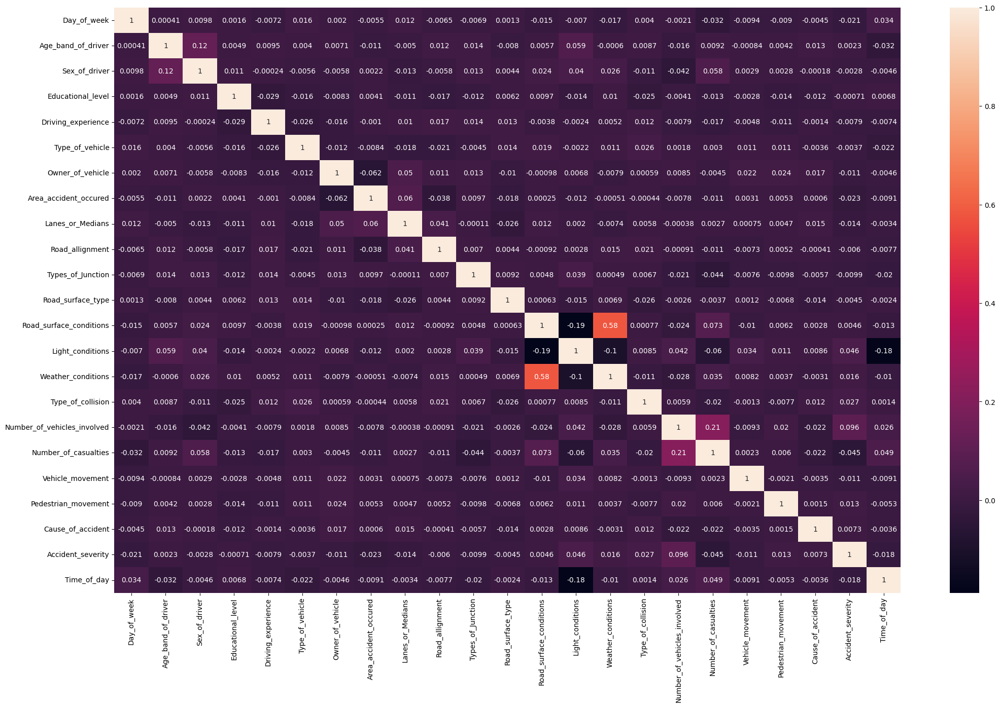

In [383]:
# correaltion heatmap
plt.figure(figsize=[25,15])
sns.heatmap(data_enc.corr(), annot=True)

In [384]:
# Features and target
X = data_enc.drop('Accident_severity', axis=1)
y = data_enc['Accident_severity']

In [385]:
# split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [386]:
def evaluate_model(name, model, X_test, y_test):
    y_pred = model.predict(X_test)
    print(f"{name} Metrics:")
    print(classification_report(y_test, y_pred))
    print(f"{name} Confusion Matrix:")
    print(confusion_matrix(y_test, y_pred))

# **Modeling Part 1: Baseline**

**model: RandomForestClassifier**

In [387]:
# model: RandomForestClassifier

rf = RandomForestClassifier(
    n_estimators=600, bootstrap=True, oob_score=True, n_jobs=-1,
    class_weight='balanced_subsample', random_state=42)
rf.fit(X_train, y_train)

RandomForestClassifier(class_weight='balanced_subsample', n_estimators=600,
                       n_jobs=-1, oob_score=True, random_state=42)

In [388]:
print(f"OOB score: {rf.oob_score_:.4f}")

evaluate_model("RandomForest", rf, X_test, y_test)

OOB score: 0.8512
RandomForest Metrics:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        37
           1       1.00      0.02      0.05       363
           2       0.84      1.00      0.91      2064

    accuracy                           0.84      2464
   macro avg       0.61      0.34      0.32      2464
weighted avg       0.85      0.84      0.77      2464

RandomForest Confusion Matrix:
[[   0    0   37]
 [   0    9  354]
 [   0    0 2064]]


acc = 84 is looks high, but the model predict almost everything as class 2 (the majority class in data) and thats not good, shows strong class imbalance issue

**Using GradientBoostingClassifier**

In [389]:
gb = GradientBoostingClassifier(
    n_estimators=900,
    learning_rate=0.10,
    max_depth=5,
    subsample=1.0,
    validation_fraction=0.2,
    n_iter_no_change=10,
    random_state=42
)
gb.fit(X_train, y_train)

GradientBoostingClassifier(max_depth=5, n_estimators=900, n_iter_no_change=10,
                           random_state=42, validation_fraction=0.2)

In [390]:
evaluate_model("GradientBoosting", gb, X_test, y_test)

GradientBoosting Metrics:
              precision    recall  f1-score   support

           0       1.00      0.08      0.15        37
           1       0.62      0.06      0.10       363
           2       0.85      0.99      0.91      2064

    accuracy                           0.84      2464
   macro avg       0.82      0.38      0.39      2464
weighted avg       0.82      0.84      0.78      2464

GradientBoosting Confusion Matrix:
[[   3    1   33]
 [   0   20  343]
 [   0   11 2053]]


The recall in class 0 and 1 is not good, not detecting enough data

**Using VotingClassifier**

In [391]:
voting = VotingClassifier(
    estimators=[('rf', rf), ('gb', gb)],
    voting='soft',  )

# Fit
voting.fit(X_train, y_train)

VotingClassifier(estimators=[('rf',
                              RandomForestClassifier(class_weight='balanced_subsample',
                                                     n_estimators=600,
                                                     n_jobs=-1, oob_score=True,
                                                     random_state=42)),
                             ('gb',
                              GradientBoostingClassifier(max_depth=5,
                                                         n_estimators=900,
                                                         n_iter_no_change=10,
                                                         random_state=42,
                                                         validation_fraction=0.2))],
                 voting='soft')

In [392]:
evaluate_model("Voting Random, Forest & Gradient Boosting", voting, X_test, y_test)

Voting Random, Forest & Gradient Boosting Metrics:
              precision    recall  f1-score   support

           0       1.00      0.05      0.10        37
           1       0.83      0.05      0.10       363
           2       0.84      1.00      0.91      2064

    accuracy                           0.84      2464
   macro avg       0.89      0.37      0.37      2464
weighted avg       0.84      0.84      0.78      2464

Voting Random, Forest & Gradient Boosting Confusion Matrix:
[[   2    0   35]
 [   0   19  344]
 [   0    4 2060]]


# **Modeling Part 2: SMOTE**

In [393]:
# smote
smote = SMOTE(sampling_strategy='not majority', random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

**model: RandomForestClassifier**

In [394]:
# model: RandomForestClassifier

rf_smote = RandomForestClassifier(
    n_estimators=600, bootstrap=True, oob_score=True, n_jobs=-1,
    class_weight='balanced_subsample', random_state=42)
rf_smote.fit(X_train_smote, y_train_smote)
print(f"OOB score(With SMOTE): {rf_smote.oob_score_:.4f}")

evaluate_model("RandomForest", rf_smote, X_test, y_test)

OOB score(With SMOTE): 0.9291
RandomForest Metrics:
              precision    recall  f1-score   support

           0       0.33      0.08      0.13        37
           1       0.29      0.23      0.26       363
           2       0.86      0.90      0.88      2064

    accuracy                           0.79      2464
   macro avg       0.49      0.40      0.42      2464
weighted avg       0.77      0.79      0.78      2464

RandomForest Confusion Matrix:
[[   3    9   25]
 [   1   84  278]
 [   5  197 1862]]


**Using GradientBoostingClassifier**

In [395]:
gb_smote = GradientBoostingClassifier(
    n_estimators=900,
    learning_rate=0.10,
    max_depth=5,
    subsample=1.0,
    validation_fraction=0.2,
    n_iter_no_change=10,
    random_state=42
)
gb_smote.fit(X_train_smote, y_train_smote)
evaluate_model("Gradient Boosting (With SMOTE)", gb_smote, X_test, y_test)

Gradient Boosting (With SMOTE) Metrics:
              precision    recall  f1-score   support

           0       0.22      0.11      0.15        37
           1       0.28      0.25      0.26       363
           2       0.86      0.89      0.87      2064

    accuracy                           0.78      2464
   macro avg       0.45      0.41      0.43      2464
weighted avg       0.77      0.78      0.77      2464

Gradient Boosting (With SMOTE) Confusion Matrix:
[[   4    8   25]
 [   4   91  268]
 [  10  226 1828]]


Since classifiers do not perform well on unbalanced datasets. They end up correctly classifying the majority class or classes at expense of the minority class.
One way to deal with unbalanced datasets is SMOTE (Synthetic Minority Oversampling Technique). It is an algorithm that generates new sample data by creating synthetic examples that are combinations of the closest minority cases.
[Blog Source](https://medium.com/analytics-vidhya/a-random-forest-classifier-with-imbalanced-data-7ef4d9ebedb8)

So applied it to handle the imbalance in our dataset and to generates new synthetic samples for the minority classes (In our case the Fatal and Serious injuries), so that the model can learn more evenly from all classes.

This helped the models slightly improve their recall for rare injuries, though the predictions are still biased toward the “Slight” class.

In [406]:
# saving the gb_smote model
with open('gb_smote.pkl', 'wb') as f:
    pickle.dump(gb_smote, f)

In [409]:
# saving the gb model
with open('gb.pkl', 'wb') as f:
    pickle.dump(gb, f)

# **Precitions On New Data**

In [399]:
data

,Day_of_week,Age_band_of_driver,Sex_of_driver,Educational_level,Driving_experience,Type_of_vehicle,Owner_of_vehicle,Area_accident_occured,Lanes_or_Medians,Road_allignment,...,Light_conditions,Weather_conditions,Type_of_collision,Number_of_vehicles_involved,Number_of_casualties,Vehicle_movement,Pedestrian_movement,Cause_of_accident,Accident_severity,Time_of_day
0,Monday,18-30,Male,Above high school,1-2yr,Automobile,Owner,Residential areas,Two-way (divided with broken lines road marking),Tangent road with flat terrain,...,Daylight,Normal,Collision with roadside-parked vehicles,2,2,Going straight,Not a Pedestrian,Moving Backward,Slight Injury,Afternoon
1,Monday,31-50,Male,Junior high school,Above 10yr,Public (> 45 seats),Owner,Office areas,Undivided Two way,Tangent road with flat terrain,...,Daylight,Normal,Vehicle with vehicle collision,2,2,Going straight,Not a Pedestrian,Overtaking,Slight Injury,Afternoon
2,Monday,18-30,Male,Junior high school,1-2yr,Lorry (41?100Q),Owner,Recreational areas,other,Tangent road with flat terrain,...,Daylight,Normal,Collision with roadside objects,2,2,Going straight,Not a Pedestrian,Changing lane to the left,Serious Injury,Afternoon
3,Sunday,18-30,Male,Junior high school,5-10yr,Public (> 45 seats),Governmental,Office areas,other,Tangent road with mild grade and flat terrain,...,Darkness - lights lit,Normal,Vehicle with vehicle collision,2,2,Going straight,Not a Pedestrian,Changing lane to the right,Slight Injury,Night
4,Sunday,18-30,Male,Junior high school,2-5yr,Automobile,Owner,Industrial areas,other,Tangent road with flat terrain,...,Darkness - lights lit,Normal,Vehicle with vehicle collision,2,2,Going straight,Not a Pedestrian,Overtaking,Slight Injury,Night
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12311,Wednesday,31-50,Male,Junior high school,2-5yr,Lorry (11?40Q),Owner,Outside rural areas,Undivided Two way,Tangent road with flat terrain,...,Daylight,Normal,Vehicle with vehicle collision,2,1,Going straight,Not a Pedestrian,No distancing,Slight Injury,Afternoon
12312,Sunday,18-30,Male,Elementary school,5-10yr,Automobile,Owner,Outside rural areas,Two-way (divided with broken lines road marking),Escarpments,...,Daylight,Normal,Vehicle with vehicle collision,2,1,Other,Not a Pedestrian,No distancing,Slight Injury,Evening
12313,Sunday,Over 51,Male,Junior high school,5-10yr,Bajaj,Owner,Outside rural areas,Two-way (divided with broken lines road marking),Tangent road with mountainous terrain and,...,Daylight,Normal,Vehicle with vehicle collision,1,1,Other,Not a Pedestrian,Changing lane to the right,Serious Injury,Afternoon
12314,Sunday,18-30,Female,Junior high school,Above 10yr,Lorry (41?100Q),Owner,Office areas,Undivided Two way,Tangent road with mountainous terrain and,...,Darkness - lights lit,Normal,Vehicle with vehicle collision,2,1,Other,Not a Pedestrian,Driving under the influence of drugs,Slight Injury,Afternoon


In [400]:
feature_order = X_train.columns.tolist() # the model features order

#  transform the input with the same pre processing we did
def transform_inputs(x_dict, ord_enc, ordinal_features, label_encoders, feature_order):
    df = pd.DataFrame([x_dict]).copy()

    # ensure all expected columns exist
    for c in feature_order:
        if c not in df:
            df[c] = np.nan

    # ordinal enc
    ord_cols = list(ordinal_features.keys())
    if ord_cols:
        df[ord_cols] = ord_enc.transform(df[ord_cols])

    # label encoder
    for col, le in label_encoders.items():
        df[col] = le.transform(df[col].astype(str))

    # cast to numeric and reorder
    df = df[feature_order].apply(pd.to_numeric, errors='coerce').fillna(0)
    return df

# predict function
def pred(x_dict):
    X = transform_inputs(x_dict, ord_enc, ordinal_features, label_encoders, feature_order)
    pred_id = gb_smote.predict(X)[0]
    probs   = gb_smote.predict_proba(X)[0]
    pred_lbl = y_enc.inverse_transform([pred_id])[0]
    return pred_lbl, dict(zip(y_enc.classes_, probs))

In [401]:
X_new = {
    'Time_of_day': 'Afternoon',
    'Day_of_week': 'Wednesday',
    'Age_band_of_driver': '18-30',
    'Educational_level': 'Junior high school',
    'Driving_experience': 'Above 10yr',
    'Light_conditions': 'Daylight',

    'Area_accident_occured': 'Office areas',
    'Lanes_or_Medians': 'Two-way (divided with broken lines road marking)',
    'Road_allignment': 'Escarpments',
    'Types_of_Junction': 'Y Shape',
    'Road_surface_type': 'Gravel roads',
    'Type_of_collision': 'Collision with roadside objects',
    'Vehicle_movement': 'Going straight',
    'Weather_conditions': 'Normal',
    'Sex_of_driver': 'Male',
    'Cause_of_accident': 'Changing lane to the right',
    'Type_of_vehicle': 'Public (13?45 seats)',
    'Road_surface_conditions': 'Dry',
    'Owner_of_vehicle': 'Governmental',
    'Pedestrian_movement': 'Not a Pedestrian',

    'Number_of_casualties': 1,
    'Number_of_vehicles_involved': 2
}

label, proba = pred(X_new)
print("Prediction:", label)
print("Probabilities:", proba)

Prediction: Slight Injury
Probabilities: {'Fatal injury': np.float64(5.047325529158747e-07), 'Serious Injury': np.float64(0.020007824275787473), 'Slight Injury': np.float64(0.9799916709916595)}


In [403]:
# Pringing each columns unqiue labels (just to help with UI dropdown input)
for col in data.columns:
    print("="*70)
    print(f"{col}  |  dtype: {data[col].dtype}  |  unique: {data[col].nunique()}")
    print(data[col].unique())
    print()

Day_of_week  |  dtype: category  |  unique: 7
['Monday', 'Sunday', 'Friday', 'Wednesday', 'Saturday', 'Thursday', 'Tuesday']
Categories (7, object): ['Friday', 'Monday', 'Saturday', 'Sunday', 'Thursday', 'Tuesday',
                         'Wednesday']

Age_band_of_driver  |  dtype: category  |  unique: 4
['18-30', '31-50', 'Under 18', 'Over 51']
Categories (4, object): ['18-30', '31-50', 'Over 51', 'Under 18']

Sex_of_driver  |  dtype: category  |  unique: 2
['Male', 'Female']
Categories (2, object): ['Female', 'Male']

Educational_level  |  dtype: category  |  unique: 6
['Above high school', 'Junior high school', 'Elementary school', 'High school', 'Illiterate', 'Writing & reading']
Categories (6, object): ['Above high school', 'Elementary school', 'High school', 'Illiterate',
                         'Junior high school', 'Writing & reading']

Driving_experience  |  dtype: category  |  unique: 6
['1-2yr', 'Above 10yr', '5-10yr', '2-5yr', 'No Licence', 'Below 1yr']
Categories (6, obj

In [404]:
# (for UI dropdowns)
DropDown_CHOICES = {}

# Ordinal choices
for col, cats in zip(ordinal_features.keys(), ord_enc.categories_):
    DropDown_CHOICES[col] = list(cats)

# Nominal choices
for col, le in label_encoders.items():
    DropDown_CHOICES[col] = list(le.classes_)

# Numeric ranges
DropDown_CHOICES['Number_of_casualties'] = sorted(data['Number_of_casualties'].unique().tolist())
DropDown_CHOICES['Number_of_vehicles_involved'] = sorted(data['Number_of_vehicles_involved'].unique().tolist())

In [405]:
DropDown_CHOICES

{'Time_of_day': ['Night', 'Morning', 'Afternoon', 'Evening'],
 'Day_of_week': ['Sunday',
  'Monday',
  'Tuesday',
  'Wednesday',
  'Thursday',
  'Friday',
  'Saturday'],
 'Age_band_of_driver': ['Under 18', '18-30', '31-50', 'Over 51'],
 'Educational_level': ['Illiterate',
  'Writing & reading',
  'Elementary school',
  'Junior high school',
  'High school',
  'Above high school'],
 'Driving_experience': ['No Licence',
  'Below 1yr',
  '1-2yr',
  '2-5yr',
  '5-10yr',
  'Above 10yr'],
 'Light_conditions': ['Darkness - no lighting',
  'Darkness - lights unlit',
  'Darkness - lights lit',
  'Daylight'],
 'Area_accident_occured': ['Church areas',
  'Hospital areas',
  'Industrial areas',
  'Market areas',
  'Office areas',
  'Other',
  'Outside rural areas',
  'Recreational areas',
  'Residential areas',
  'Rural village areas',
  'Rural village areasOffice areas',
  'School areas'],
 'Lanes_or_Medians': ['Double carriageway (median)',
  'One way',
  'Two-way (divided with broken lines road